In [1]:
import numpy as np
import pandas as pd
from shutil import copyfile
from matplotlib import gridspec
from astropy.io import fits
from astropy import wcs
from astropy.table import Table
from spec_tools import Source_present, Photometry, Scale_model, Oldest_galaxy
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
from glob import glob
import seaborn as sea
import os
from grizli import multifit
from grizli import model

from time import time
sea.set(style='white')
sea.set(style='ticks')
sea.set_style({'xtick.direct'
               'ion': 'in','xtick.top':True,'xtick.minor.visible': True,
               'ytick.direction': "in",'ytick.right': True,'ytick.minor.visible': True})
cmap = sea.cubehelix_palette(12, start=2, rot=.2, dark=0, light=1.0, as_cmap=True)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### set home for files
hpath = os.environ['HOME'] + '/'

# Generate Beam GSD-41250

In [330]:
mosaic = hpath + 'Data/CLEAR/CATALOGS/goodss_v4.4/goodss-F105W-astrodrizzle-v4.4_drz_sci.fits'
seg_map = hpath + 'Clear_data/goodss_mosaic/goodss_3dhst.v4.0.F160W_seg.fits'
catalog = hpath + 'Data/CLEAR/CATALOGS/goodss_v4.4/goodss-F105W-astrodrizzle-v4.4_drz_sub.cat'
flt_path = hpath + 'Clear_data/s_flt_files/'
flt_path_g141 = hpath + '3dhst/s_flt_files/'
galaxy_id = 41520

In [331]:
ref_cat_loc = Table.read('/Users/vestrada/Clear_data/goodss_mosaic/goodss_3dhst.v4.3.cat',format='ascii').to_pandas()
ref_cat = Table.read(catalog,format='ascii')

galaxy_ra = float(ref_cat_loc['ra'][ref_cat_loc['id'] == galaxy_id])
galaxy_dec = float(ref_cat_loc['dec'][ref_cat_loc['id'] == galaxy_id])

FileNotFoundError: [Errno 2] No such file or directory: '/Users/vestrada/Clear_data/goodss_mosaic/goodss_3dhst.v4.3.cat'

In [43]:
flt_files = glob(flt_path + '*')

grism_flts = []
for i in flt_files:
    in_flt,loc = Source_present(i,galaxy_ra,galaxy_dec)
    if in_flt:
        grism_flts.append(i)
        print('x={0:0.1f} y={1:0.1f}, PA={2:0.1f}, file={3} '.format(
            loc[0],loc[1],fits.open(i)[0].header['PA_V3'], os.path.basename(i)))
        
flt_files = glob(flt_path_g141 + '*')

for i in flt_files:
    in_flt,loc = Source_present(i,galaxy_ra,galaxy_dec)
    if in_flt:
        grism_flts.append(i)
        print('x={0:0.1f} y={1:0.1f}, PA={2:0.1f}, file={3} '.format(
            loc[0],loc[1],fits.open(i)[0].header['PA_V3'], os.path.basename(i)))

x=24.6 y=379.5, PA=193.0, file=icxt30s0q_flt.fits 
x=34.5 y=382.9, PA=193.0, file=icxt30s2q_flt.fits 
x=31.1 y=389.5, PA=193.0, file=icxt30s5q_flt.fits 
x=21.0 y=386.0, PA=193.0, file=icxt30s7q_flt.fits 
x=24.4 y=379.5, PA=193.0, file=icxt31r1q_flt.fits 
x=34.4 y=383.0, PA=193.0, file=icxt31r3q_flt.fits 
x=30.9 y=389.5, PA=193.0, file=icxt31r6q_flt.fits 
x=20.9 y=386.0, PA=193.0, file=icxt31r8q_flt.fits 
x=99.6 y=256.2, PA=173.0, file=icxt32nlq_flt.fits 
x=89.6 y=252.7, PA=173.0, file=icxt32nmq_flt.fits 
x=86.1 y=259.2, PA=173.0, file=icxt32npq_flt.fits 
x=96.1 y=262.7, PA=173.0, file=icxt32nrq_flt.fits 
x=99.7 y=256.3, PA=173.0, file=icxt33roq_flt.fits 
x=89.7 y=252.8, PA=173.0, file=icxt33rpq_flt.fits 
x=86.2 y=259.3, PA=173.0, file=icxt33rsq_flt.fits 
x=96.2 y=262.8, PA=173.0, file=icxt33ruq_flt.fits 
x=7.7 y=549.1, PA=216.0, file=icxt34ekq_flt.fits 
x=17.7 y=552.6, PA=216.0, file=icxt34emq_flt.fits 
x=14.2 y=559.1, PA=216.0, file=icxt34epq_flt.fits 
x=4.2 y=555.6, PA=216.0, file=ic

In [44]:
grp = multifit.GroupFLT(grism_files = grism_flts, direct_files = [], 
              ref_file = mosaic,
              seg_file = seg_map,
              catalog = ref_cat,
              cpu_count = 2,verbose = False)

Image cutout: x=slice(5790, 11056, None), y=slice(12084, 17506, None)
Image cutout: x=slice(5796, 11062, None), y=slice(12107, 17529, None)
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(5790, 11056, None), y=slice(12084, 17506, None)
Image cutout: x=slice(5796, 11062, None), y=slice(12107, 17529, None)
/Users/vestrada/Clear_data/s_flt_files/icxt30s0q_flt.fits / Pad ref HDU with 50 pixels
/Users/vestrada/Clear_data/s_flt_files/icxt30s2q_flt.fits / Pad ref HDU with 50 pixels
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(5781, 11047, None), y=slice(12107, 17529, None)
Image cutout: x=slice(5775, 11040, None), y=slice(12084, 17506, None)
Using default C-based coordinate transformation...
Using default C-based coordinate transformation..

In [45]:
grp.compute_full_model(mag_limit=25)


/Users/vestrada/Clear_data/s_flt_files/icxt30s0q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt30s2q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt30s5q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt30s7q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt31r1q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt31r3q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt31r6q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt31r8q_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt32nlq_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt32nmq_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt32npq_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt32nrq_flt.fits: _compute_model Done
/Users/vestrada/Clear_data/s_flt_files/icxt33roq_flt

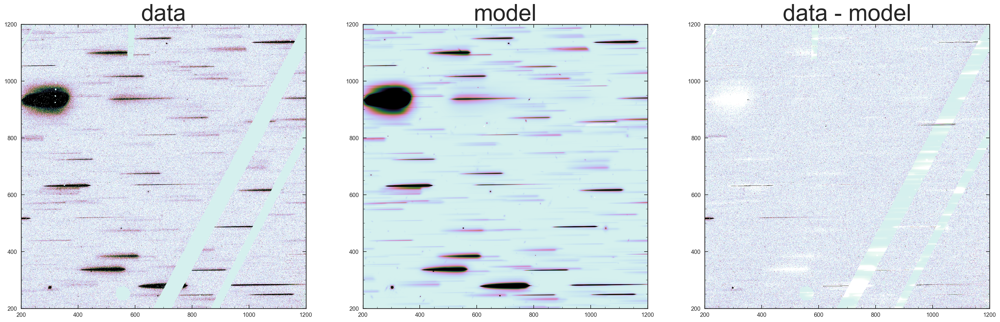

In [46]:
fig, axes = plt.subplots(1,3, figsize=[30,10])
axes[0].imshow(grp.FLTs[0].grism['SCI'], vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')
axes[1].imshow(grp.FLTs[0].model, vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')
axes[2].imshow(grp.FLTs[0].grism['SCI'] - grp.FLTs[0].model, vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')

axes[0].set_title('data', fontsize = 40)
axes[1].set_title('model', fontsize = 40)
axes[2].set_title('data - model', fontsize = 40)

for ax in axes:
    ax.set_xlim(200,1200) 
    ax.set_ylim(200,1200)

In [47]:
grp.refine_list(poly_order=2, mag_limits=[16, 24], verbose=False)

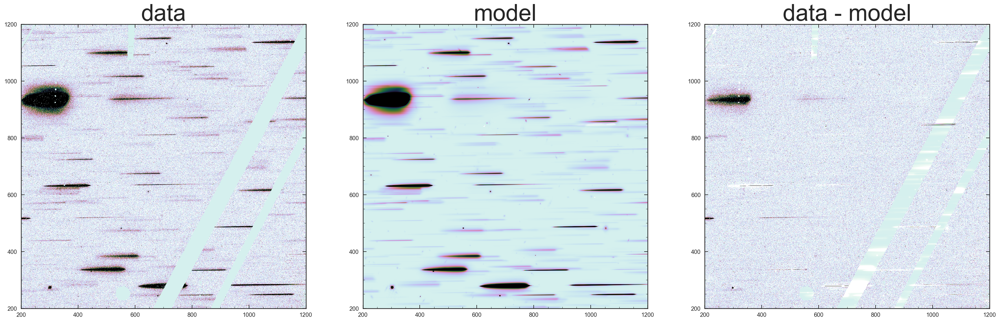

In [48]:

fig.clf()
fig, axes = plt.subplots(1,3, figsize=[30,10])
axes[0].imshow(grp.FLTs[0].grism['SCI'], vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')
axes[1].imshow(grp.FLTs[0].model, vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')
axes[2].imshow(grp.FLTs[0].grism['SCI'] - grp.FLTs[0].model, vmin=-0.02, vmax=0.2, cmap='cubehelix_r',interpolation='Nearest', origin='lower')
axes[0].set_title('data', fontsize = 40)
axes[1].set_title('model', fontsize = 40)
axes[2].set_title('data - model', fontsize = 40)

for ax in axes:
    ax.set_xlim(200,1200) 
    ax.set_ylim(200,1200)

In [49]:
beams = grp.get_beams(galaxy_id, size=80)
print("beams: ", beams)
mb = multifit.MultiBeam(beams, fcontam=0.0, group_name='../beams/GSD')
mb.write_master_fits()

beams:  [<grizli.model.BeamCutout object at 0x1a32b1b860>, <grizli.model.BeamCutout object at 0x1b2ebad198>, <grizli.model.BeamCutout object at 0x1a232c3cf8>, <grizli.model.BeamCutout object at 0x1a232c2d68>, <grizli.model.BeamCutout object at 0x1a232bdda0>, <grizli.model.BeamCutout object at 0x1a232bbfd0>, <grizli.model.BeamCutout object at 0x1a232c6e80>, <grizli.model.BeamCutout object at 0x1a232dac18>, <grizli.model.BeamCutout object at 0x1a232f8f60>, <grizli.model.BeamCutout object at 0x1a232f3cc0>, <grizli.model.BeamCutout object at 0x1a23304eb8>, <grizli.model.BeamCutout object at 0x1a2330ad68>, <grizli.model.BeamCutout object at 0x1a23312ba8>, <grizli.model.BeamCutout object at 0x1a7e7fbe80>, <grizli.model.BeamCutout object at 0x1a7e802be0>, <grizli.model.BeamCutout object at 0x1a7e807dd8>, <grizli.model.BeamCutout object at 0x1a7e80fc88>, <grizli.model.BeamCutout object at 0x1a7e815e80>, <grizli.model.BeamCutout object at 0x1a7e81deb8>, <grizli.model.BeamCutout object at 0x1a7e

In [57]:
g102 = mb.oned_spectrum()['G102']
g141 = mb.oned_spectrum()['G141']

(0, 2e-18)

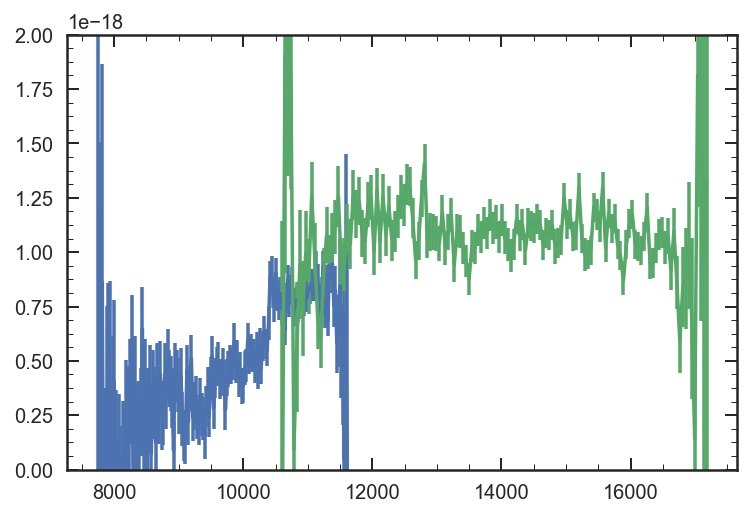

In [58]:
plt.errorbar(g102['wave'],g102['flux']/g102['flat'],g102['err']/g102['flat'])
plt.errorbar(g141['wave'],g141['flux']/g141['flat'],g141['err']/g141['flat'])
plt.ylim(0,2E-18)

# Collect all data

In [2]:
mb = multifit.MultiBeam('../beams/GSD_41520.beams.fits')

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3393: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3422: RuntimeWarning: invalid value encountered in sqrt
  resid = np.abs(self.scif - self.flat_flam)*np.sqrt(self.ivarf)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3427: RuntimeWarning: invalid value encountered in sqrt
  contam_mask = ((self.contam*np.sqrt(self.ivar) > contam_sn_mask[0]) &
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3428: RuntimeWarning: invalid value encountered in sqrt
  (self.model*np.sqrt

1 /Users/vestrada/Clear_data/s_flt_files/icxt30s0q_flt.fits G102
2 /Users/vestrada/Clear_data/s_flt_files/icxt30s2q_flt.fits G102
3 /Users/vestrada/Clear_data/s_flt_files/icxt30s5q_flt.fits G102
4 /Users/vestrada/Clear_data/s_flt_files/icxt30s7q_flt.fits G102
5 /Users/vestrada/Clear_data/s_flt_files/icxt31r1q_flt.fits G102
6 /Users/vestrada/Clear_data/s_flt_files/icxt31r3q_flt.fits G102
7 /Users/vestrada/Clear_data/s_flt_files/icxt31r6q_flt.fits G102
8 /Users/vestrada/Clear_data/s_flt_files/icxt31r8q_flt.fits G102
9 /Users/vestrada/Clear_data/s_flt_files/icxt32nlq_flt.fits G102
10 /Users/vestrada/Clear_data/s_flt_files/icxt32nmq_flt.fits G102
11 /Users/vestrada/Clear_data/s_flt_files/icxt32npq_flt.fits G102
12 /Users/vestrada/Clear_data/s_flt_files/icxt32nrq_flt.fits G102
13 /Users/vestrada/Clear_data/s_flt_files/icxt33roq_flt.fits G102
14 /Users/vestrada/Clear_data/s_flt_files/icxt33rpq_flt.fits G102
15 /Users/vestrada/Clear_data/s_flt_files/icxt33rsq_flt.fits G102
16 /Users/vestrada/

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1200: RuntimeWarning: divide by zero encountered in true_divide
  beam.ivarf = 1./(1/beam.ivarf + (sys_err*beam.scif)**2)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1328: RuntimeWarning: invalid value encountered in sqrt
  self.sivarf = np.sqrt(self.ivarf)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1333: RuntimeWarning: invalid value encountered in sqrt
  self.weightf = np.exp(-(self.fcontam*np.abs(self.contamf)*np.sqrt(self.ivarf)))
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:2948: FutureWarning: `rcond` parameter will change to the default of

In [29]:
sphotdb = pd.read_pickle('../../Quiescent_analysis/data/south_phot.pkl')
sf_list=[]
for i in sphotdb.columns:
    if i[0] == 'f':
        sf_list.append(i)

(0, 20000)

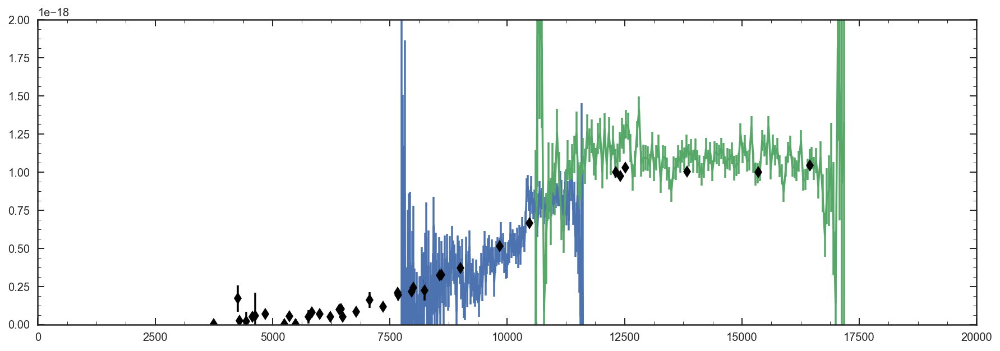

In [71]:
# phot = Photometry(sp.stack_wv,sp.stack_fl,sp.stack_er,203)
# phot.Get_Sensitivity()
# phot.Photo()
# Clam = 3E18 / sphotdb['f_F125W'][0] **2 * 10**((-1.1)/2.5-29)
# mod = Clam*sphotdb['f_F125W'][41519]


plt.figure(figsize=[15,5])
plt.errorbar(g102['wave'],g102['flux']/g102['flat'],g102['err']/g102['flat'])
plt.errorbar(g141['wave'],g141['flux']/g141['flat'],g141['err']/g141['flat'])
for ii in sf_list:
    Clam = 3E18 / sphotdb[ii][0] **2 * 10**((-1.1)/2.5-29)
    if sphotdb[ii][41519] > 0:
        plt.errorbar(sphotdb[ii][0],Clam*sphotdb[ii][41519],Clam*sphotdb['e' + ii[1:]][41519],
                             linestyle='None', marker='d', markersize=8, color='k')
        
plt.ylim(0,2E-18)
plt.xlim(0,20000)

In [72]:
phot_41520= []
phot_er_41520= []
phot_effwv_41520= []

for ii in sf_list:
    Clam = 3E18 / sphotdb[ii][0] **2 * 10**((-1.1)/2.5-29)
    if sphotdb[ii][41519] > 0:
        phot_effwv_41520.append(sphotdb[ii][0])
        phot_41520.append(Clam*sphotdb[ii][41519])
        phot_er_41520.append(Clam*sphotdb['e' + ii[1:]][41519])


(0, 20000)

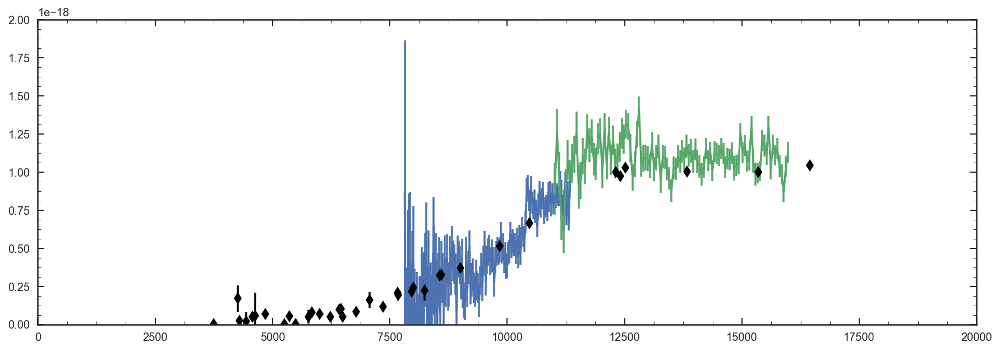

In [74]:
ID1 = [U for U in range(len(g102['wave'])) if 7800 < g102['wave'][U] < 11350]
ID2 = [U for U in range(len(g141['wave'])) if 11000 < g141['wave'][U] < 16000]

plt.figure(figsize=[15,5])
plt.errorbar(g102['wave'][ID1],g102['flux'][ID1]/g102['flat'][ID1],g102['err'][ID1]/g102['flat'][ID1])
plt.errorbar(g141['wave'][ID2],g141['flux'][ID2]/g141['flat'][ID2],g141['err'][ID2]/g141['flat'][ID2])
plt.errorbar(phot_effwv_41520,phot_41520,phot_er_41520,
                             linestyle='None', marker='d', markersize=8, color='k')
        
plt.ylim(0,2E-18)
plt.xlim(0,20000)

In [75]:
# np.save('../phot/GSD_41520_phot', [phot_effwv_41520,phot_41520,phot_er_41520])

## Reload

In [4]:
mb = multifit.MultiBeam('../beams/GSD_41520.beams.fits')
phot_effwv_41520,phot_41520,phot_er_41520 = np.load('../phot/GSD_41520_phot.npy')
g102 = mb.oned_spectrum()['G102']
g141 = mb.oned_spectrum()['G141']
ID1 = [U for U in range(len(g102['wave'])) if 7800 < g102['wave'][U] < 11350]
ID2 = [U for U in range(len(g141['wave'])) if 11000 < g141['wave'][U] < 16000]


/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3423: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3452: RuntimeWarning: invalid value encountered in sqrt
  resid = np.abs(self.scif - self.flat_flam)*np.sqrt(self.ivarf)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3457: RuntimeWarning: invalid value encountered in sqrt
  contam_mask = ((self.contam*np.sqrt(self.ivar) > contam_sn_mask[0]) &
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3458: RuntimeWarning: invalid value encountered in sqrt
  (self.model*np.sqrt(sel

1 /Users/vestrada/Clear_data/s_flt_files/icxt30s0q_flt.fits G102
2 /Users/vestrada/Clear_data/s_flt_files/icxt30s2q_flt.fits G102
3 /Users/vestrada/Clear_data/s_flt_files/icxt30s5q_flt.fits G102
4 /Users/vestrada/Clear_data/s_flt_files/icxt30s7q_flt.fits G102
5 /Users/vestrada/Clear_data/s_flt_files/icxt31r1q_flt.fits G102
6 /Users/vestrada/Clear_data/s_flt_files/icxt31r3q_flt.fits G102
7 /Users/vestrada/Clear_data/s_flt_files/icxt31r6q_flt.fits G102
8 /Users/vestrada/Clear_data/s_flt_files/icxt31r8q_flt.fits G102
9 /Users/vestrada/Clear_data/s_flt_files/icxt32nlq_flt.fits G102
10 /Users/vestrada/Clear_data/s_flt_files/icxt32nmq_flt.fits G102
11 /Users/vestrada/Clear_data/s_flt_files/icxt32npq_flt.fits G102
12 /Users/vestrada/Clear_data/s_flt_files/icxt32nrq_flt.fits G102
13 /Users/vestrada/Clear_data/s_flt_files/icxt33roq_flt.fits G102
14 /Users/vestrada/Clear_data/s_flt_files/icxt33rpq_flt.fits G102
15 /Users/vestrada/Clear_data/s_flt_files/icxt33rsq_flt.fits G102
16 /Users/vestrada/

/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1214: RuntimeWarning: divide by zero encountered in true_divide
  beam.ivarf = 1./(1/beam.ivarf + (sys_err*beam.scif)**2)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1354: RuntimeWarning: invalid value encountered in sqrt
  self.sivarf = np.sqrt(self.ivarf)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1359: RuntimeWarning: invalid value encountered in sqrt
  self.weightf = np.exp(-(self.fcontam*np.abs(self.contamf)*np.sqrt(self.ivarf)))
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:548: RuntimeWarning: divide by zero encountered in true_divide
  self.optim

In [27]:
pht1 = Photometry(g102['wave'],g102['flux']/g102['flat'],g102['err']/g102['flat'],201)
pht1.Get_Sensitivity()
pht1.Photo()

pht2 = Photometry(g141['wave'],g141['flux']/g141['flat'],g141['err']/g141['flat'],203)
pht2.Get_Sensitivity()
pht2.Photo()

pht = Photometry(g141['wave'],g141['flux']/g141['flat'],g141['err']/g141['flat'],203)

/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':


/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


(0, 24000)

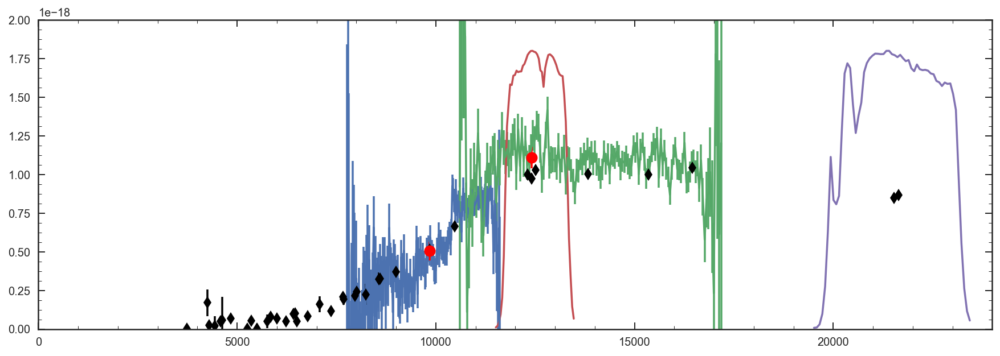

In [30]:
plt.figure(figsize=[15,5])
plt.errorbar(g102['wave'],g102['flux']/g102['flat'],g102['err']/g102['flat'])
plt.errorbar(g141['wave'],g141['flux']/g141['flat'],g141['err']/g141['flat'])
plt.errorbar(phot_effwv_41520,phot_41520,phot_er_41520,
                             linestyle='None', marker='d', markersize=8, color='k')

pht.Get_Sensitivity(220)
plt.plot(pht.sens_wv,pht.trans*1.8E-18)
pht.Get_Sensitivity(200)
plt.plot(pht.sens_wv,pht.trans*1.8E-18)

plt.errorbar(pht1.eff_wv, pht1.photo, pht1.photo_er,fmt='ro',ms=10)
plt.errorbar(pht2.eff_wv, pht2.photo, pht2.photo_er,fmt='ro',ms=10)

plt.ylim(0,2E-18)
plt.xlim(0,24000)

(3000, 6200)

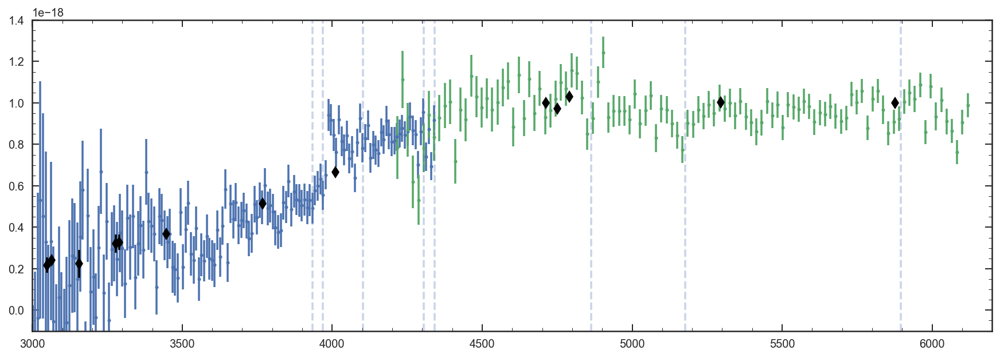

In [8]:
mod1 = phot_41520[1] / pht1.photo
mod2 = phot_41520[3] / pht2.photo


plt.figure(figsize=[15,5])
plt.errorbar(g102['wave'][ID1]/(2.6121),g102['flux'][ID1]/g102['flat'][ID1] * mod1,g102['err'][ID1]/g102['flat'][ID1]* mod1,
            linestyle='None', marker='o', markersize=3)
plt.errorbar(g141['wave'][ID2]/(2.6121),g141['flux'][ID2]/g141['flat'][ID2] * mod2,g141['err'][ID2]/g141['flat'][ID2]* mod2,
            linestyle='None', marker='o', markersize=3)
plt.errorbar(phot_effwv_41520/(2.6121),phot_41520,phot_er_41520,
                             linestyle='None', marker='d', markersize=8, color='k')

plt.axvline(3934.777,linestyle='--', alpha=.3)
plt.axvline(3969.588,linestyle='--', alpha=.3)
plt.axvline(4102.89,linestyle='--', alpha=.3)
plt.axvline(4305.61,linestyle='--', alpha=.3)
plt.axvline(4341.68,linestyle='--', alpha=.3)
plt.axvline(4862.68,linestyle='--', alpha=.3)
plt.axvline(5176.7,linestyle='--', alpha=.3)
plt.axvline(5895.6,linestyle='--', alpha=.3)

plt.ylim(-1E-19,1.4E-18)
plt.xlim(3000,6200)

In [32]:
ref_cat_loc = Table.read('/Users/vestrada/Clear_data/goodsn_mosaic/goodsn_3dhst.v4.3.cat',format='ascii').to_pandas()


In [37]:
filters = [U for U in ref_cat_loc.keys() if U[0:2] == 'f_']

In [33]:
filts_a, num_a = np.loadtxt('/Users/vestrada/Data/CLEAR/CATALOGS/goodsn_v4.3.translate',dtype=str).T

In [34]:
filts = [U for U in filts_a if U[0:2] == 'f_']
num = [int(U[1:]) for U in num_a if U[0] == 'F']

In [39]:
for i in range(len(filters)):
    print(filts[i], num[i])
#     print(filters[i])

f_F160W 205
f_U 227
f_F435W 233
f_G 229
f_F606W 236
f_Rs 231
f_F775W 238
f_F850LP 240
f_F125W 203
f_J 224
f_F140W 204
f_H 225
f_Ks 226
f_IRAC1 18
f_IRAC2 19
f_IRAC3 20
f_IRAC4 21
f_B 114
f_V 115
f_R 285
f_I 283
f_Z 284
f_F105W 202


In [40]:
allfilts = [205, 105, 107, 103, 1, 46, 50, 236, 4, 260, 54, 5, 58, 239, 7, 240, 201, 202, 
 203, 34, 220, 204, 36, 222, 37, 18, 19, 20, 21, 181, 182, 183, 184, 185, 186,
 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 227, 233, 114, 229,
 115, 236, 285, 231, 283, 238, 284, 240, 224, 225, 226]

In [46]:
WV,FL = np.load('/Users/vestrada/fsps_models_for_fit/fsps_spec/m0.019_a2.5_dt8.0_spec.npy')
ER = np.ones(len(WV))
pht = Photometry(WV,FL,ER,203)

all_ews = []
for i in allfilts:
    pht.Get_Sensitivity(i)
    pht.Photo()
    all_ews.append(pht.eff_wv)


In [48]:
model_phot_df = pd.DataFrame({'eff_wv': all_ews, 'tmp_num' : allfilts})

In [51]:
model_phot_df = model_phot_df.sort_values('eff_wv')

In [52]:
model_phot_df.to_pickle('../phot/model_photometry_list.pkl')

# Create photometry template for data

In [56]:
fname, fnum = np.loadtxt('../phot/master_template_list.dat',dtype=str).T

In [58]:
fews = []
for i in fnum:
    pht.Get_Sensitivity(int(i))
    pht.Photo()
    fews.append(pht.eff_wv)

In [75]:
master_tmp_df = pd.DataFrame({'eff_wv': fews, 'tmp_num' : np.array(fnum).astype(int), 'tmp_name' : fname})

In [76]:
master_tmp_df.to_pickle('../phot/master_template_list.pkl')

In [64]:
master_tmp_df = master_tmp_df.sort_values('eff_wv')#.to_pickle('../phot/master_template_list.pkl')

In [68]:
galdf = ref_cat_loc.query('id==41520')

In [96]:
ref_cat_loc[ref_cat_loc.id == 41520]

,id,x,y,ra,dec,faper_F160W,eaper_F160W,faper_F140W,eaper_F140W,f_F160W,...,flux_radius,fwhm_image,flags,IRAC1_contam,IRAC2_contam,IRAC3_contam,IRAC4_contam,contam_flag,f140w_flag,use
41519,41520,8708.345,15930.595,53.152726,-27.716251,14.272883,0.022551,11.509615,0.081041,21.639546,...,3.935,4.5,3,0.025721,0.058434,0.018005,0.044478,0,0,1


In [86]:
galdf.f_U50

41519   -0.050907
Name: f_U50, dtype: float64

In [97]:
def Phot_save(catalog_DF, galaxy_id, field, masterlist = '../phot/master_template_list.pkl'):
    galdf = ref_cat_loc[ref_cat_loc.id == galaxy_id]
    master_tmp_df = pd.read_pickle(masterlist)
        
    if field == 'GSD':
        pre= 'S_'
     
    if field == 'GND':
        pre= 'N_'
    
    eff_wv = []
    phot_fl = []
    phot_er = []
    phot_num = []

    for i in galdf.keys():
        if i[0:2] == 'f_':
            Clam = 3E18 / master_tmp_df.eff_wv[master_tmp_df.tmp_name == pre + i].values[0] **2 * 10**((-1.1)/2.5-29)
            if galdf[i].values[0] > -99.0:
                eff_wv.append(master_tmp_df.eff_wv[master_tmp_df.tmp_name == pre + i].values[0])
                phot_fl.append(galdf[i].values[0]*Clam)
                phot_num.append(master_tmp_df.tmp_num[master_tmp_df.tmp_name == pre + i].values[0])
        if i[0:2] == 'e_':
            if galdf[i].values[0] > -99.0:
                phot_er.append(galdf[i].values[0]*Clam)

    np.save('../phot/{0}_{1}_phot'.format(field, galaxy_id), [eff_wv,phot_fl,phot_er,phot_num])

In [101]:
Phot_save(ref_cat_loc, 39170, 'GSD')

In [102]:
eff_wv,phot_fl,phot_er,phot_num = np.load('../phot/GSD_41520_phot.npy')

<ErrorbarContainer object of 3 artists>

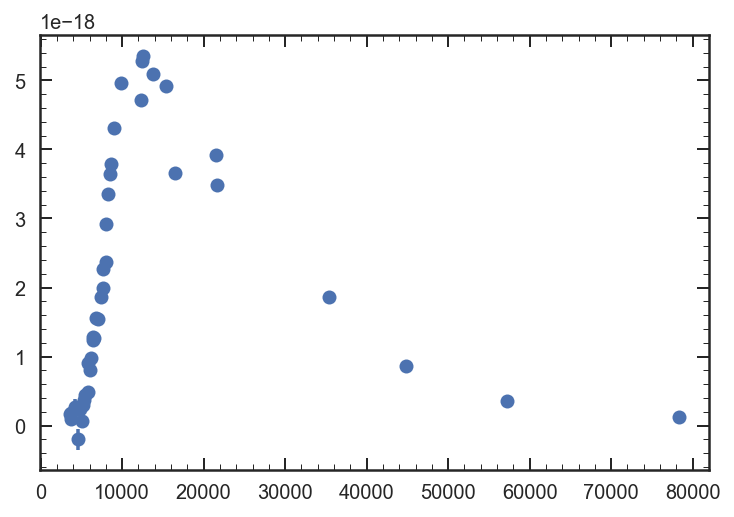

In [103]:
plt.errorbar(eff_wv,phot_fl,phot_er,fmt='o')

# Create photometry template for model

In [2]:
from time import time

In [203]:
WV,FL = np.load(hpath+'fsps_models_for_fit/fsps_spec/m0.019_a2.5_dt8.0_spec.npy')
ER = np.ones(len(WV))
model_photDF = pd.read_pickle('../phot/model_photometry_list.pkl')
pht = Photometry(WV,FL,ER,203)

sens=[]
trans=[]
for i in model_photDF.index:
    pht.Get_Sensitivity(model_photDF.tmp_num[i])
    isens = np.linspace(pht.sens_wv[0],pht.sens_wv[-1],200)
    itrans = interp1d(pht.sens_wv,pht.trans)(isens)
    
    sens.append(isens)
    trans.append(itrans)
np.save('../templates/master_tmp',[sens,trans])

$\frac{\int S F_\nu (1/h\nu) d\nu}{\int S (1/h\nu) d\nu}$

In [68]:
eff_wv,phot_fl,phot_er,phot_num = np.load('../phot/GSD_41520_phot.npy')

In [79]:
IDX = []
for i in range(len(phot_num)):
    for ii in range(len(model_photDF)):
        if phot_num[i] == model_photDF.tmp_num[model_photDF.index[ii]]:
            IDX.append(ii)

In [256]:
c=3E18          # speed of light cm s^-1

sens_wv, trans = np.load('../templates/master_tmp.npy')

b=[]
dnu=[]
adj=[]
meffwv = []
for i in range(len(sens_wv)):
    b.append(trans[i] * 1 / (c /(sens_wv[i])))

    dnu.append(c /(sens_wv[i]))

    adj.append(c / (model_photDF.eff_wv[model_photDF.index[i]]) ** 2)

    meffwv.append(model_photDF.eff_wv[model_photDF.index[i]])
np.save('../templates/bottom_precalc',b)
np.save('../templates/dnu_precalc',dnu)
np.save('../templates/adj_precalc',adj)
np.save('../templates/effwv_precalc',meffwv)

In [244]:
b,dnu,adj,meffwv = np.load('../templates/precalc.npy')


In [249]:
b.shape

(62,)

In [310]:
sens_wv, trans = np.load('../templates/master_tmp.npy')
b = np.load('../templates/bottom_precalc.npy')
dnu = np.load('../templates/dnu_precalc.npy')
adj = np.load('../templates/adj_precalc.npy')
mdleffwv = np.load('../templates/effwv_precalc.npy') 
model_photDF = pd.read_pickle('../phot/model_photometry_list.pkl')

def Model_phot(mwv, mfl, IDX, model_photDF,sens_wv, trans,
              b,dnu,adj,mdleffwv):
#     start = time()
    
    c=3E18          # speed of light cm s^-1
    
#     end = time()
#     print(end - start)
    
#     start = time()
    imfl =interp1d(c / mwv, (c/(c / mwv)**2) * mfl)
    
#     end = time()
#     print(end - start)
    
#     start = time()
    
    mphot = (np.trapz(imfl(c /(sens_wv[IDX])).reshape([len(IDX),len(sens_wv[0])]) \
                      * b[IDX],dnu[IDX])/np.trapz(b[IDX],dnu[IDX])) * adj[IDX]

#     end = time()
#     print(end - start)
    return np.array([mdleffwv[IDX],mphot])

In [327]:
mwv, mfl = np.load(hpath + 'fsps_models_for_fit/fsps_spec/m0.015_a2.5_dt0_spec.npy')

meffwv,mphot = Model_phot(mwv*(1+1.615),mfl,IDX,model_photDF,sens_wv, trans,
              b,dnu,adj,mdleffwv)

In [326]:
%%timeit
Model_phot(mwv*(1+1.615),mfl,IDX,model_photDF,sens_wv, trans,
              b,dnu,adj,mdleffwv)

1.21 ms ± 52.8 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [328]:
C = Scale_model(phot_fl,phot_er,mphot)

<ErrorbarContainer object of 3 artists>

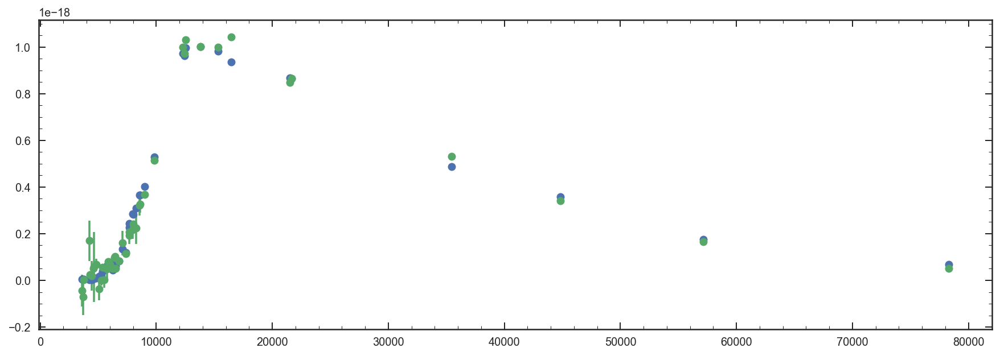

In [329]:
plt.figure(figsize=[15,5])
plt.plot(meffwv,C*mphot,'o')
plt.errorbar(eff_wv,phot_fl,phot_er,fmt='o')

In [97]:
def Chi_Squared(data, model, error):
    return np.sum(((data-model) / error)**2)

In [135]:
metal=np.round(np.arange(0.002,0.031,0.001),3)
age=np.round(np.arange(.5,6.1,.1),1)
tau=[0,8.0, 8.3, 8.48, 8.6, 8.7, 8.78, 8.85, 8.9, 8.95, 9.0, 9.04, 9.08, 9.11, 9.15, 9.18, 9.2, 9.23, 9.26, 9.28,
     9.3, 9.32, 9.34, 9.36, 9.38, 9.4, 9.41, 9.43, 9.45, 9.46, 9.48]
z = np.arange(1.55,1.65,0.001)


In [324]:
# %%timeit
chi = []

mwv, mfl = np.load(hpath + 'fsps_models_for_fit/fsps_spec/m0.015_a2.5_dt0_spec.npy')

for i in range(len(z)):

    meffwv,mphot = Model_phot(mwv*(1+z[i]),mfl,IDX,model_photDF,sens_wv, trans,b,dnu,adj,mdleffwv)
    
    C = Scale_model(phot_fl,phot_er,mphot)
    
    chi.append(Chi_Squared(phot_fl,mphot*C,phot_er))

In [321]:
0.0541/z.size*metal.size *age.size*len(tau) / 60 * 40 / 60

0.30262337777777776

(array([1.615]), 596.9196252011706)

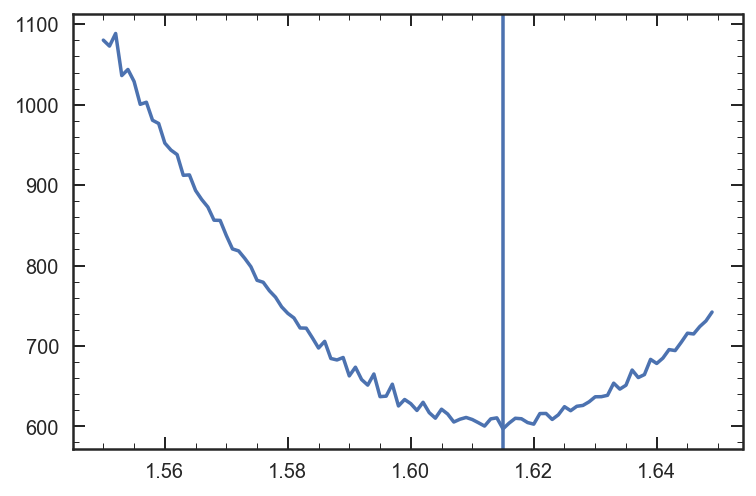

In [325]:
plt.plot(z,chi)
plt.axvline(np.array(z)[chi == min(chi)])
np.array(z)[chi == min(chi)],min(chi)

## Create Gen_spec

In [2]:
def Calzetti_low(Av,lam):
    lam = lam * 1E-4
    Rv=4.05
    k = 2.659*(-2.156 +1.509/(lam) -0.198/(lam**2) +0.011/(lam**3)) + Rv
    cal = 10**(-0.4*k*Av/Rv)
    return cal

def Calzetti_hi(Av,lam):
    lam = lam * 1E-4
    Rv=4.05
    k = 2.659*(-1.857 +1.04/(lam)) + Rv
    cal = 10**(-0.4*k*Av/Rv)    
    
    return cal

def Calzetti(Av,lam):
    dust = Calzetti_low(Av,lam)
    dust2 = Calzetti_hi(Av,lam)
    
    for ii in range(len(dust)):
        if lam[ii] > 6300:
            dust[ii]=dust2[ii] 
    
    return dust
  
def Chi_Squared(data, model, error):
    return np.sum(((data-model) / error)**2)
    
model_path = hpath + 'fsps_models_for_fit/fsps_spec/'

class Gen_spec(object):
    def __init__(self, field, galaxy_id, specz, g102_beam, g141_beam,
                 g102_lims = [7900, 11300], g141_lims = [11100, 16000],
                 filter_102 = 201, filter_141 = 203, tmp_err = False, phot_tmp_err = False):
        self.field = field
        self.galaxy_id = galaxy_id
        self.specz = specz
        self.c = 3E18          # speed of light angstrom s^-1
        self.mb = multifit.MultiBeam('../beams/{0}_{1}.beams.fits'.format(self.field, self.galaxy_id),
                                    verbose = False)
        self.g102_lims = g102_lims
        self.g141_lims = g141_lims
        
        """
        B - prefix refers to g102
        R - prefix refers to g141
        P - prefix refers to photometry
        
        field - GND/GSD/UDS
        galaxy_id - ID number from 3D-HST
        specz - z_grism
        g102_lims - window for g102
        g141_lims - window for g141
        filter_102 - photometric filter used to scale g102 flux
        filter_141 - photometric filter used to scale g141 flux
        tmp_err - (flag) whether or not we apply a template error function (not available)
        mb - MultiBeam object
        """
        
        self.Bwv = self.mb.oned_spectrum()['G102']['wave']
        self.Bflt = self.mb.oned_spectrum()['G102']['flat']
        self.Bflx_o = self.mb.oned_spectrum()['G102']['flux']
        self.Berr_o = self.mb.oned_spectrum()['G102']['err']
        self.Bflx = self.Bflx_o / self.Bflt
        self.Berr = self.Berr_o / self.Bflt
        
        self.Rwv = self.mb.oned_spectrum()['G141']['wave']
        self.Rflt = self.mb.oned_spectrum()['G141']['flat']
        self.Rflx_o = self.mb.oned_spectrum()['G141']['flux']
        self.Rerr_o = self.mb.oned_spectrum()['G141']['err']
        self.Rflx = self.Rflx_o / self.Rflt
        self.Rerr = self.Rerr_o / self.Rflt
        
        self.Pwv, self.Pflx, self.Perr, self.Pnum = np.load('../phot/{0}_{1}_phot.npy'.format(field, galaxy_id))
        self.Pwv_rf = self.Pwv / (1+self.specz)
        
        Bscale, Rscale = self.Scale_grism_spec(filter_102, filter_141)
        
        self.IDB = [U for U in range(len(self.Bwv)) if g102_lims[0] <= self.Bwv[U] <= g102_lims[-1]]
        self.IDR = [U for U in range(len(self.Rwv)) if g141_lims[0] <= self.Rwv[U] <= g141_lims[-1]]

        self.Bwv = self.Bwv[self.IDB]
        self.Bwv_rf = self.Bwv / (1 + specz)
        self.Bflt = self.Bflt[self.IDB]
        self.Bflx = self.Bflx[self.IDB] * Bscale
        self.Berr = self.Berr[self.IDB] * Bscale
        
        self.Rwv = self.Rwv[self.IDR]
        self.Rwv_rf = self.Rwv / (1 + specz)
        self.Rflt = self.Rflt[self.IDR]
        self.Rflx = self.Rflx[self.IDR] * Rscale
        self.Rerr = self.Rerr[self.IDR] * Rscale

        self.model_photDF = pd.read_pickle('../phot/model_photometry_list.pkl')
        
        self.IDP = []
        for i in range(len(self.Pnum)):
            for ii in range(len(self.model_photDF)):
                if self.Pnum[i] == self.model_photDF.tmp_num[self.model_photDF.index[ii]]:
                    self.IDP.append(ii)
        
        if phot_tmp_err:
            ewv, tmp= np.loadtxt(hpath + 'eazy-photoz/templates/TEMPLATE_ERROR.eazy_v1.0').T
            iphterr = interp1d(ewv,tmp)(self.Pwv_rf)
            self.Perr_o = self.Perr
            self.Perr = np.sqrt(self.Perr**2 + (iphterr * self.Pflx)**2)
            
#         if tmp_err:
#             WV,TEF = np.load(data_path + 'template_error_function.npy')
#             iTEF = interp1d(WV,TEF)(self.gal_wv_rf)
#             self.gal_er = np.sqrt(self.gal_er**2 + (iTEF*self.fl)**2)

        self.Bbeam = model.BeamCutout(fits_file= g102_beam)
        self.Rbeam = model.BeamCutout(fits_file= g141_beam)

        ### Define precalculated terms for photometry
        self.sens_wv, self.trans = np.load('../templates/master_tmp.npy')
        self.b = np.load('../templates/bottom_precalc.npy')
        self.dnu = np.load('../templates/dnu_precalc.npy')
        self.adj = np.load('../templates/adj_precalc.npy')
        self.mdleffwv = np.load('../templates/effwv_precalc.npy') 
        
    def Scale_grism_spec(self,filter_102, filter_141):
    
        pht1 = Photometry(self.Bwv,self.Bflx,self.Bflx,filter_102)
        pht1.Get_Sensitivity()
        pht1.Photo()
        
        pht2 = Photometry(self.Rwv,self.Rflx,self.Rflx,filter_141)
        pht2.Get_Sensitivity()
        pht2.Photo()
        
        Bscale = self.Pflx[self.Pnum == filter_102] / pht1.photo
        Rscale = self.Pflx[self.Pnum == filter_141] / pht2.photo
        
        return Bscale,Rscale
    
    def Sim_spec_indv(self, BEAM, model_wave, model_flux):
        ### creates a model using an individual beam
        BEAM.beam.compute_model(spectrum_1d=[model_wave, model_flux])
        w, f, e = BEAM.beam.optimal_extract(BEAM.beam.model, bin=0)
        return w, f
        
    def Sim_spec_mult(self, model_wave, model_flux):
        ### creates a model for g102 and g141 using individual beams
        return self.Sim_spec_indv(self.Bbeam, model_wave, model_flux), \
                self.Sim_spec_indv(self.Rbeam, model_wave, model_flux)

    def Sim_spec(self, metal, age, tau, model_redshift = 0, Av = 0):
        if model_redshift ==0:
            model_redshift = self.specz

        model_wave, model_flux = np.load(model_path + 'm{0}_a{1}_dt{2}_spec.npy'.format(
            metal, age, tau))

        [Bmw, Bmf], [Rmw, Rmf] = self.Sim_spec_mult(model_wave * (1 + model_redshift), 
                                                                        model_flux * Calzetti(Av,model_wave))
        iBmf = interp1d(Bmw,Bmf)(self.Bwv)       
        iRmf = interp1d(Rmw,Rmf)(self.Rwv)     
        
        self.Bmfl = iBmf / self.Bflt
        self.Rmfl = iRmf / self.Rflt
            
        self.Bmfl *= Scale_model(self.Bflx, self.Berr, self.Bmfl)
        
        self.Rmfl *= Scale_model(self.Rflx, self.Rerr, self.Rmfl)

    def Sim_phot_mult(self, model_wave, model_flux):
        
        imfl =interp1d(self.c / model_wave, (self.c/(self.c / model_wave)**2) * model_flux)

        mphot = (np.trapz(imfl(self.c /(self.sens_wv[self.IDP])).reshape([len(self.IDP),len(self.sens_wv[0])]) \
                          * self.b[self.IDP],self.dnu[self.IDP])/np.trapz(self.b[self.IDP],
                                                                          self.dnu[self.IDP])) * self.adj[self.IDP]
        
        return np.array([self.mdleffwv[self.IDP],mphot])

    def Sim_phot(self, metal, age, tau, model_redshift = 0, Av = 0):
        if model_redshift ==0:
            model_redshift = self.specz

        model_wave, model_flux = np.load(model_path + 'm{0}_a{1}_dt{2}_spec.npy'.format(
            metal, age, tau))

        
        self.Pmwv, self.Pmfl = self.Sim_phot_mult(model_wave * (1 + model_redshift), 
                                                  model_flux * Calzetti(Av,model_wave))
        self.PC =  Scale_model(self.Pflx, self.Perr, self.Pmfl)  
        self.Pmfl *= self.PC
        
    def Sim_all(self, metal, age, tau, model_redshift = 0, Av = 0):
        self.Sim_spec(metal, age, tau, model_redshift, Av)
        self.Sim_phot(metal, age, tau, model_redshift, Av)
    

In [3]:
g102_beam = '../beams/o173_1_41520.g102.A.fits'
g141_beam = '../beams/o229_1_41520.g141.A.fits'

sp = Gen_spec('GSD',41520,1.606,g102_beam,g141_beam,g102_lims=[8000,11350],phot_tmp_err=True)

/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3423: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3452: RuntimeWarning: invalid value encountered in sqrt
  resid = np.abs(self.scif - self.flat_flam)*np.sqrt(self.ivarf)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3457: RuntimeWarning: invalid value encountered in sqrt
  contam_mask = ((self.contam*np.sqrt(self.ivar) > contam_sn_mask[0]) &
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3458: RuntimeWarning: invalid value encountered in sqrt
  (self.model*np.sqrt(sel

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:544: RuntimeWarning: divide by zero encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:544: RuntimeWarning: invalid value encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)


(3, 4.698970004336019)

<Figure size 1080x576 with 0 Axes>

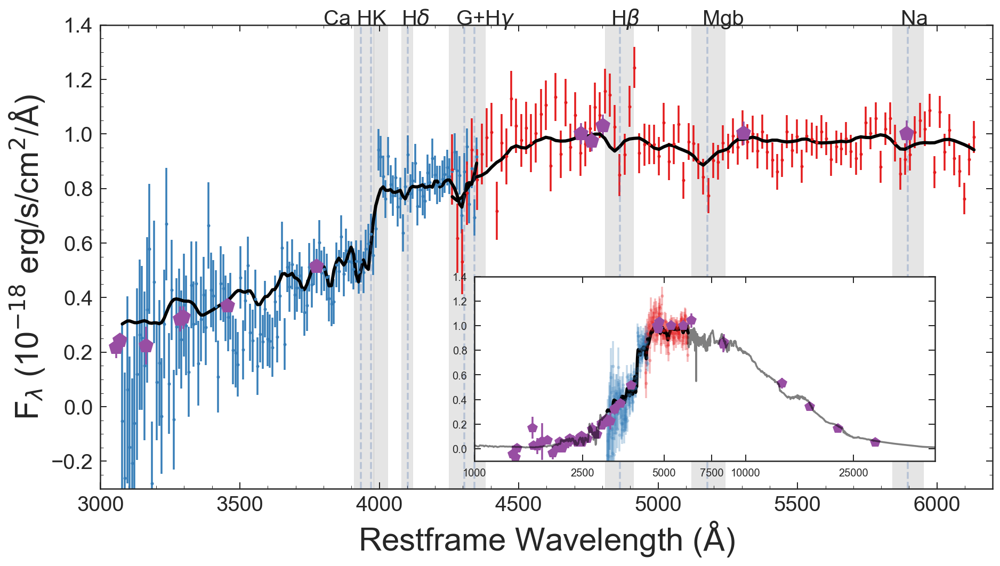

In [77]:
sp.Sim_all(0.012,3.8,8.48,Av=0)

wv,fl = np.load('/Users/Vince.ec/fsps_models_for_fit/fsps_spec/m0.012_a3.8_dt8.48_spec.npy')
cal = Calzetti(0,wv)
plt.figure(figsize=[15,8])
plt.rcParams["figure.figsize"] = (15,8)

# These are in unitless percentages of the figure size. (0,0 is bottom left)
fig,ax1 = plt.subplots()
left, bottom, width, height = [0.45, 0.17, 0.4, 0.3]

ax1.errorbar(sp.Bwv_rf,sp.Bflx*1E18,sp.Berr*1E18,
            linestyle='None', marker='o', markersize=3, color='#377eb8')
ax1.errorbar(sp.Rwv_rf,sp.Rflx*1E18,sp.Rerr*1E18,
            linestyle='None', marker='o', markersize=3, color='#e41a1c')
ax1.plot(sp.Bwv_rf,sp.Bmfl*1E18,'k',linewidth=3)
ax1.plot(sp.Rwv_rf,sp.Rmfl*1E18,'k',linewidth=3)
ax1.errorbar(sp.Pwv_rf,sp.Pflx*1E18,sp.Perr*1E18,
                             linestyle='None', marker='p', markersize=15, color='#984ea3')
# ax1.plot(sp.Pwv_rf,sp.Pmfl,'ko',ms=15,zorder =5)

ax1.set_ylim(-.3,1.4)
ax1.set_xlim(3000,6200)
plt.ylabel('F$_\lambda$ (10$^{-18}$ erg/s/cm$^2$/$\\rm \AA$)',size=30)
plt.xlabel('Restframe Wavelength ($\\rm \AA$)',size=30)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.axvline(3934.777,linestyle='--', alpha=.3)
plt.axvline(3969.588,linestyle='--', alpha=.3)
plt.axvline(4102.89,linestyle='--', alpha=.3)
plt.axvline(4305.61,linestyle='--', alpha=.3)
plt.axvline(4341.68,linestyle='--', alpha=.3)
plt.axvline(4862.68,linestyle='--', alpha=.3)
plt.axvline(5176.7,linestyle='--', alpha=.3)
plt.axvline(5895.6,linestyle='--', alpha=.3)
plt.axvspan(3910, 3980, color='k', alpha=.1)
plt.axvspan(3980, 4030, color='k', alpha=.1)
plt.axvspan(4080, 4120, color='k', alpha=.1)
plt.axvspan(4250, 4380, color='k', alpha=.1)
plt.axvspan(4810, 4910, color='k', alpha=.1)
plt.axvspan(5120, 5240, color='k', alpha=.1)
plt.axvspan(5840, 5950, color='k', alpha=.1)
plt.text(3800,1.4,'Ca HK',fontsize=20)
plt.text(4080,1.4,'H$\delta$',fontsize=20)
plt.text(4275,1.4,'G+H$\gamma$',fontsize=20)
plt.text(4830,1.4,'H$\\beta$',fontsize=20)
plt.text(5160,1.4,'Mgb',fontsize=20)
plt.text(5870,1.4,'Na',fontsize=20)

ax2 = fig.add_axes([left, bottom, width, height])
ax2.errorbar(np.log10(sp.Bwv_rf),sp.Bflx*1E18,sp.Berr*1E18,
            linestyle='None', marker='o', markersize=3, color='#377eb8', alpha=.3)
ax2.errorbar(np.log10(sp.Rwv_rf),sp.Rflx*1E18,sp.Rerr*1E18,
            linestyle='None', marker='o', markersize=3, color='#e41a1c', alpha=.3)

ax2.errorbar(np.log10(sp.Pwv_rf),sp.Pflx*1E18,sp.Perr*1E18,
                             linestyle='None', marker='p', markersize=10, color='#984ea3')
IDb = [U for U in range(len(wv)) if wv[U] < sp.Bwv_rf[0]]
IDr = [U for U in range(len(wv)) if wv[U] > sp.Rwv_rf[-1]]

ax2.plot(np.log10(wv[IDb]),sp.PC*fl[IDb]*1E18,'k',ms=10,zorder =5,alpha=0.5)
ax2.plot(np.log10(wv[IDr]),sp.PC*fl[IDr]*1E18,'k',ms=10,zorder =5,alpha=0.5)

ax2.plot(np.log10(sp.Bwv_rf),sp.Bmfl*1E18,'k',linewidth=3)
ax2.plot(np.log10(sp.Rwv_rf),sp.Rmfl*1E18,'k',linewidth=3)

plt.xticks(np.log10([1000,2500,5000,7500,10000,25000]),[1000,2500,5000,7500,10000,25000])
ax2.minorticks_off()
ax2.set_ylim(-.1,1.4)
ax2.set_xlim(3,np.log10(50000))
# plt.savefig('../plots/example_fit.png',bbox_inches = 'tight')


In [5]:
metal=np.round(np.arange(0.002,0.031,0.001),3)
age=np.round(np.arange(.5,6.1,.1),1)
# age=np.round(np.arange(.5,4.1,.1),1)

tau=[0,8.0, 8.3, 8.48, 8.6, 8.7, 8.78, 8.85, 8.9, 8.95, 9.0, 9.04, 9.08, 9.11, 9.15, 9.18, 9.2, 9.23, 9.26, 9.28,
     9.3, 9.32, 9.34, 9.36, 9.38, 9.4, 9.41, 9.43, 9.45, 9.46, 9.48]
z = np.arange(1.55,1.65,0.0005)
dust = np.arange(0,1.1,.01)
M,A=np.meshgrid(metal,age)

In [6]:
X = metal
Y = age
Z = tau

chi = np.zeros([len(X),len(Y),len(Z)])
# chi1 = np.zeros([len(X),len(Y),len(Z)])
# chi2 = np.zeros([len(X),len(Y),len(Z)])
# chi3 = np.zeros([len(X),len(Y),len(Z)])

for i in range(len(X)):

    
    for ii in range(len(Y)):  
        x1 = np.zeros(len(Z))
        x2 = np.zeros(len(Z))
        x3 = np.zeros(len(Z))
        for iii in range(len(Z)):
            sp.Sim_all(X[i],Y[ii],Z[iii],model_redshift=1.6065,Av=0)

            x1[iii] = Chi_Squared(sp.Bflx,sp.Bmfl,sp.Berr)
            x2[iii] = Chi_Squared(sp.Rflx,sp.Rmfl,sp.Rerr)
            x3[iii] = Chi_Squared(sp.Pflx,sp.Pmfl,sp.Perr)

        chi[i][ii] = x1 + x2 + x3
#     chi1[i] = x1
#     chi2[i] = x2
#     chi3[i] = x3


/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:548: RuntimeWarning: divide by zero encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:548: RuntimeWarning: invalid value encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)


In [21]:
age_conv='/Users/vestrada/Github/Quiescent_analysis/data/light_weight_scaling_3.npy'

ultau = np.append(0, np.power(10, np.array(tau)[1:] - 9))
    
convtable = np.load(age_conv)

overhead = np.zeros([len(tau),metal.size]).astype(int)
for i in range(len(tau)):
    for ii in range(metal.size):
        amt=[]
        for iii in range(age.size):
            if age[iii] > convtable.T[i].T[ii][-1]:
                amt.append(1)
        overhead[i][ii] = sum(amt)

######## get Pd and Pz
P = np.exp(- (chi - np.min(chi)) / 2).astype(np.float128)

new_P = np.zeros(P.T.shape)

######## Reshape likelihood to get light weighted age instead of age when marginalized
for i in range(len(tau)):
    frame = np.zeros([metal.size,age.size])
    for ii in range(metal.size):
        dist = interp1d(convtable.T[i].T[ii],P.T[i].T[ii])(age[:-overhead[i][ii]])
        frame[ii] = np.append(dist,np.repeat(0, overhead[i][ii]))
    new_P[i] = frame.T

####### Create normalize probablity marginalized over tau
P = new_P.T

# test_prob = np.trapz(test_P, ultau, axis=2)
C = np.trapz(np.trapz(np.trapz(P, ultau, axis=2), age, axis=1), metal)

P /= C

prob = np.trapz(P, ultau, axis=2)

# #### Get Z, t, tau, and z posteriors
PZ = np.trapz(np.trapz(P, ultau, axis=2), age, axis=1)
Pt = np.trapz(np.trapz(P, ultau, axis=2).T, metal, axis=1)
Ptau = np.trapz(np.trapz(P.T, metal, axis=2), age, axis=1)

In [22]:
print(np.where(chi == np.min(chi)))
print(Z[0])
print(Y[23])
print(X[11])

(array([23]), array([11]), array([0]))
0
2.8
0.013


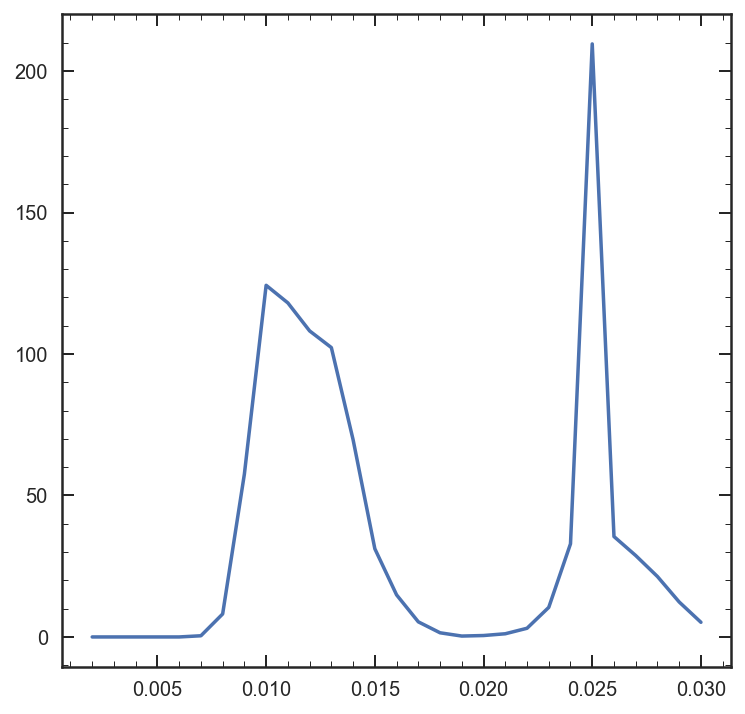

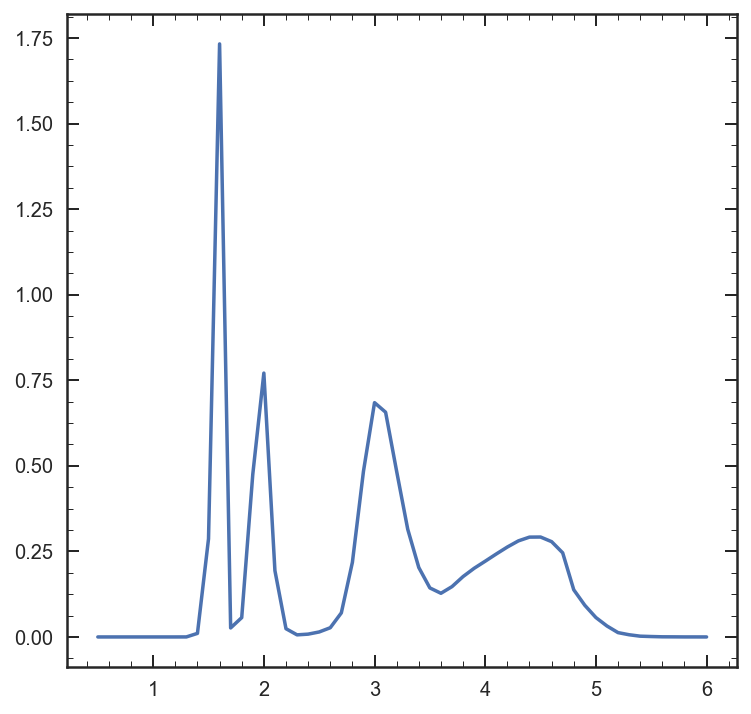

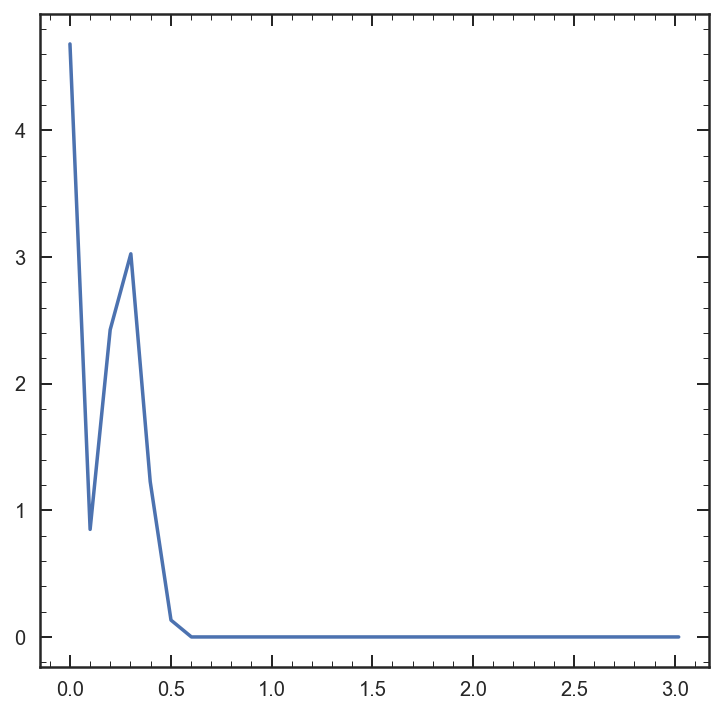

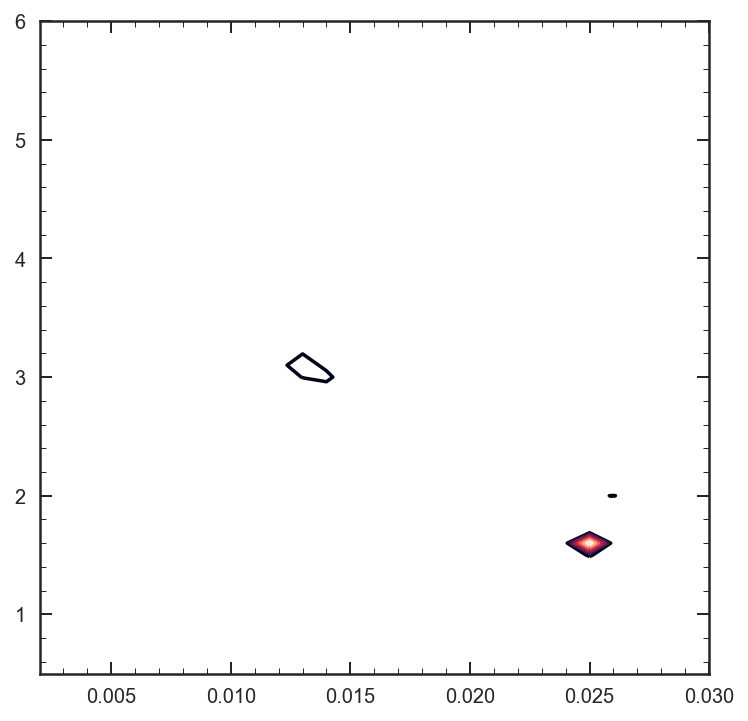

In [23]:
plt.figure(figsize=[6,6])
plt.plot(metal,PZ)

plt.figure(figsize=[6,6])
plt.plot(age,Pt)

plt.figure(figsize=[6,6])
plt.plot(ultau,Ptau)

plt.figure(figsize=[6,6])
plt.contour(M,A,prob.T)


In [48]:
from spec_tools import Oldest_galaxy

In [49]:
Oldest_galaxy(1.606)

4.030078826608844

In [50]:
def P(chi,x):
    return np.exp(-np.array(chi)/2)/ np.trapz(np.exp(-np.array(chi)/2),x)

In [57]:
# XX,YY=np.meshgrid(X,Y)

# plt.contour(XX,YY,np.exp(-chi.T/2))
# plt.contour(M,A,np.exp(-chi1.T/2))
# plt.contour(M,A,np.exp(-chi2.T/2))
# plt.contour(M,A,np.exp(-chi3.T/2))


# plt.axvline(0.023)
# plt.axhline(1.6)

print(np.where(chi.T == np.min(chi.T)))
print(Z[3])
print(Y[33])
print(X[10])

(array([3]), array([33]), array([10]))
8.48
3.8
0.012


In [2]:
ewv1, tmp1 = np.loadtxt('/Users/Vince.ec/eazy-photoz/templates/TEMPLATE_ERROR.eazy_v1.0').T
ewv2, tmp2 = np.loadtxt('/Users/Vince.ec/eazy-photoz/templates/TEMPLATE_ERROR.v2.0.zfourge').T

(1000, 100000)

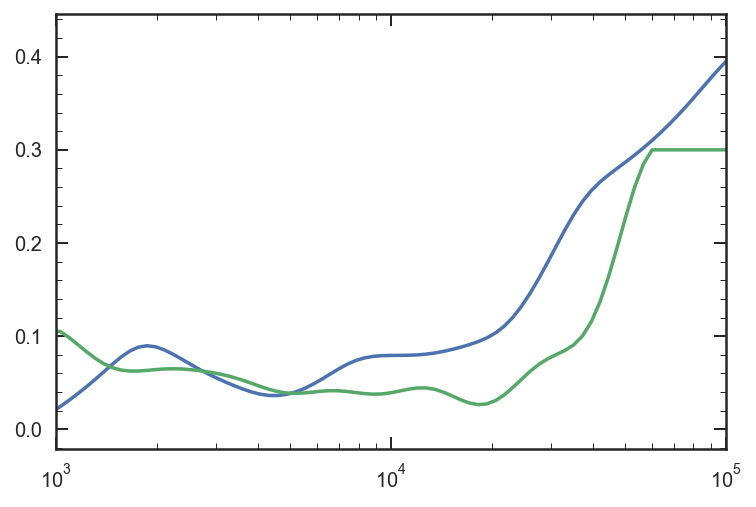

In [4]:
plt.plot(ewv1, tmp1)
plt.plot(ewv2, tmp2)
plt.xscale('log')
plt.xlim(1000,100000)

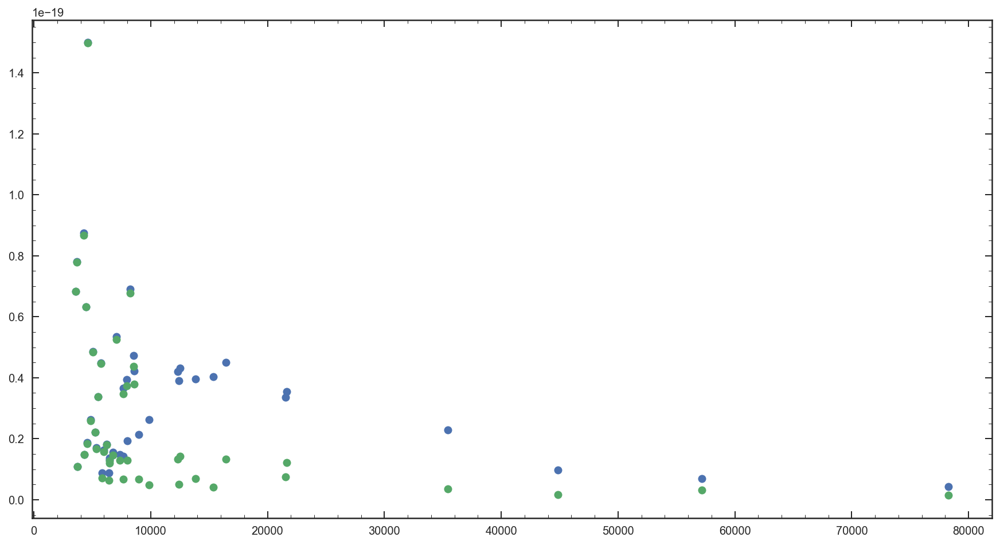

In [47]:
plt.plot(sp.Pwv,sp.Perr,'o')
plt.plot(sp.Pwv,sp.Perr_o,'o')

# Analyze

In [50]:
if hpath == '/home/vestrada78840/':
#     from C_spec_id import Scale_model, Median_w_Error_cont, Oldest_galaxy
    data_path = '/fdata/scratch/vestrada78840/data/'
    model_path ='/fdata/scratch/vestrada78840/fsps_spec/'
    chi_path = '/fdata/scratch/vestrada78840/chidat/'
    spec_path = '/fdata/scratch/vestrada78840/stack_specs/'
    beam_path = '/fdata/scratch/vestrada78840/clear_q_beams/'
    mcerr_path = '/home/vestrada78840/mcerr/'
    
else:
#     from spec_id import Scale_model, Median_w_Error_cont, Oldest_galaxy
    data_path = '../data/'
    model_path = hpath + 'fsps_models_for_fit/fsps_spec/'
    chi_path = '../chidat/'
    beam_path = '../beams/'
    out_path = '../data/posteriors/'

def Scale_model_mult(D, sig, M):
    C = np.sum(((D * M) / sig ** 2), axis=1) / np.sum((M ** 2 / sig ** 2), axis=1)
    return C

def Gen_mflgrid(spec, name, metal, age, tau, rshift):
    wv,fl = np.load(model_path + 'm0.019_a2.8_dt0_spec.npy')

    [Bmwv,Bmf_len], [Rmwv,Rmf_len] = spec.Sim_spec_mult(wv,fl)
    
    ##### set model wave
    for i in range(len(metal)):
        
        Bmfl = np.zeros([len(age)*len(tau)*len(rshift),len(Bmf_len)])
        Rmfl = np.zeros([len(age)*len(tau)*len(rshift),len(Rmf_len)])
        Pmfl = np.zeros([len(age)*len(tau)*len(rshift),len(spec.IDP)])

        for ii in range(len(age)):
            for iii in range(len(tau)):
                wv,fl = np.load(model_path + 'm{0}_a{1}_dt{2}_spec.npy'.format(metal[i], age[ii], tau[iii]))
                for iv in range(len(rshift)):
                    [Bmwv,Bmflx], [Rmwv,Rmflx] = spec.Sim_spec_mult(wv * (1 + rshift[iv]),fl)
                    Pmwv, Pmflx = spec.Sim_phot_mult(wv * (1 + rshift[iv]),fl)
                                      
                    Bmfl[ii*len(tau)*len(rshift) + iii*len(rshift) + iv] = Bmflx
                    Rmfl[ii*len(tau)*len(rshift) + iii*len(rshift) + iv] = Rmflx
                    Pmfl[ii*len(tau)*len(rshift) + iii*len(rshift) + iv] = Pmflx
        
        np.save(chi_path + 'spec_files/{0}_m{1}_g102'.format(name, metal[i]),Bmfl)
        np.save(chi_path + 'spec_files/{0}_m{1}_g141'.format(name, metal[i]),Rmfl)
        np.save(chi_path + 'spec_files/{0}_m{1}_phot'.format(name, metal[i]),Pmfl)
    
def Gen_dust_minigrid(fit_wv,rshift):
    dust_dict = {}
    Av = np.round(np.arange(0, 1.1, 0.1),1)
    for i in range(len(Av)):
        key = str(Av[i])
        minigrid = np.zeros([len(rshift),len(fit_wv)])
        for ii in range(len(rshift)):
            minigrid[ii] = Calzetti(Av[i],fit_wv / (1 + rshift[ii]))
        dust_dict[key] = minigrid
    return dust_dict
         
def Stitch_spec(grids):
    stc = []
    for i in range(len(grids)):
        stc.append(np.load(grids[i]))
        
    stc = np.array(stc)
    return stc.reshape([stc.shape[0] * stc.shape[1],stc.shape[2]])

def Resize(fit_wv, fit_flat, mwv, mfl):
    mfl = np.ma.masked_invalid(mfl)
    mfl.data[mfl.mask] = 0
    mfl = interp2d(mwv,range(len(mfl.data)),mfl.data)(fit_wv,range(len(mfl.data)))
    return mfl / fit_flat
    
def Redden_and_fit(fit_wv, fit_fl, fit_er, mfl, metal, age, tau, redshift, instrument, name):    
    minidust = Gen_dust_minigrid(fit_wv,redshift)

    Av = np.round(np.arange(0, 1.1, 0.1),1)
    for i in range(len(Av)):
        dustgrid = np.repeat([minidust[str(Av[i])]], len(metal)*len(age)*len(tau), axis=0).reshape(
            [len(minidust[str(Av[i])])*len(metal)*len(age)*len(tau), len(fit_wv)])
        redflgrid = mfl * dustgrid
        SCL = Scale_model_mult(fit_fl,fit_er,redflgrid)
        redflgrid = np.array([SCL]).T*redflgrid
        chigrid = np.sum(((fit_fl - redflgrid) / fit_er) ** 2, axis=1).reshape([len(metal), len(age), len(tau), len(redshift)])
        np.save(chi_path + '{0}_d{1}_{2}_chidata'.format(name, i, instrument),chigrid)
        
def Stitch_resize_redden_fit(fit_wv, fit_fl, fit_er, fit_flat, instrument, name, mwv, 
                     metal, age, tau, redshift, resize=True):
    #############Read in spectra and stich spectra grid together#################
    files = [chi_path + 'spec_files/{0}_m{1}_{2}.npy'.format(name, U, instrument) for U in metal]
    mfl = Stitch_spec(files)
    
    if resize:
        mfl = Resize(fit_wv, fit_flat, mwv, mfl)

    Redden_and_fit(fit_wv, fit_fl, fit_er, mfl, metal, age, tau, redshift, instrument, name)  

def Stich_grids(grids):
    stc = []
    for i in range(len(grids)):
        stc.append(np.load(grids[i]))
    return np.array(stc)
    
def Analyze_full_fit(name, metal, age, tau, rshift, dust = np.arange(0,1.1,0.1), age_conv=data_path + 'light_weight_scaling_3.npy'):
    ####### Get maximum age
    max_age = Oldest_galaxy(max(rshift))
    
    ####### Read in file   
    chi = np.zeros([len(dust),len(metal),len(age),len(tau),len(rshift)])
    instr = ['g102','g141','phot']
    
    for i in instr:
        chifiles = [chi_path + '{0}_d{1}_{2}_chidata.npy'.format(name, U, i) for U in range(len(dust))]
        chi += Stich_grids(chifiles)
    
    chi[ : , : , len(age[age <= max_age]):] = 1E5

    ####### Get scaling factor for tau reshaping
    ultau = np.append(0, np.power(10, np.array(tau)[1:] - 9))
    
    convtable = np.load(age_conv)

    overhead = np.zeros([len(tau),metal.size]).astype(int)
    for i in range(len(tau)):
        for ii in range(metal.size):
            amt=[]
            for iii in range(age.size):
                if age[iii] > convtable.T[i].T[ii][-1]:
                    amt.append(1)
            overhead[i][ii] = sum(amt)

    ######## get Pd and Pz
#     d,Priord = np.load(data_path + 'dust_prior.npy')
    
    P_full = np.exp(- chi / 2).astype(np.float128)
    
#     for i in range(len(Priord)):
#         P_full[i] = P_full[i] #* Priord[i]

    Pd = np.trapz(np.trapz(np.trapz(np.trapz(P_full, rshift, axis=4), ultau, axis=3), age, axis=2), metal, axis=1) /\
        np.trapz(np.trapz(np.trapz(np.trapz(np.trapz(P_full, rshift, axis=4), ultau, axis=3), age, axis=2), metal, axis=1),dust)

    Pz = np.trapz(np.trapz(np.trapz(np.trapz(P_full.T, dust, axis=4), metal, axis=3), age, axis=2), ultau, axis=1) /\
        np.trapz(np.trapz(np.trapz(np.trapz(np.trapz(P_full.T, dust, axis=4), metal, axis=3), age, axis=2), ultau, axis=1),rshift)

    P = np.trapz(P_full, rshift, axis=4)
    P = np.trapz(P.T, dust, axis=3).T
    new_P = np.zeros(P.T.shape)

    ######## Reshape likelihood to get light weighted age instead of age when marginalized
    for i in range(len(tau)):
        frame = np.zeros([metal.size,age.size])
        for ii in range(metal.size):
            dist = interp1d(convtable.T[i].T[ii],P.T[i].T[ii])(age[:-overhead[i][ii]])
            frame[ii] = np.append(dist,np.repeat(0, overhead[i][ii]))
        new_P[i] = frame.T

    ####### Create normalize probablity marginalized over tau
    P = new_P.T

    # test_prob = np.trapz(test_P, ultau, axis=2)
    C = np.trapz(np.trapz(np.trapz(P, ultau, axis=2), age, axis=1), metal)

    P /= C

    prob = np.trapz(P, ultau, axis=2)
    
    # #### Get Z, t, tau, and z posteriors
    PZ = np.trapz(np.trapz(P, ultau, axis=2), age, axis=1)
    Pt = np.trapz(np.trapz(P, ultau, axis=2).T, metal, axis=1)
    Ptau = np.trapz(np.trapz(P.T, metal, axis=2), age, axis=1)

    return prob.T, PZ, Pt, Ptau, Pz, Pd

def Fit_all(field, galaxy, g102_beam, g141_beam, specz, metal, age, tau, rshift, dust, name, 
        gen_models = True, age_conv= data_path + 'light_weight_scaling_3.npy'):
   
    ######## initialize spec
    sp = Gen_spec(field, galaxy, specz, g102_beam, g141_beam, phot_tmp_err = True)
    
    if gen_models:
        Gen_mflgrid(sp, name, metal, age, tau, rshift)

    ## set some variables
    wv,fl = np.load(model_path + 'm0.019_a2.0_dt8.0_spec.npy')
    [Bmwv,Bmflx], [Rmwv,Rmflx] = sp.Sim_spec_mult(wv,fl)
    
    Stitch_resize_redden_fit(sp.Bwv, sp.Bflx, sp.Berr, sp.Bflt, 'g102', name, Bmwv, 
                     metal, age, tau, rshift)
    Stitch_resize_redden_fit(sp.Rwv, sp.Rflx, sp.Rerr, sp.Rflt, 'g141', name, Rmwv, 
                     metal, age, tau, rshift)
    Stitch_resize_redden_fit(sp.Pwv, sp.Pflx, sp.Perr, 'none', 'phot', name, sp.Pwv, 
                     metal, age, tau, rshift, resize = False) 
    
    P, PZ, Pt, Ptau, Pz, Pd = Analyze_full_fit(name, metal, age, tau, rshift, 
                                               dust=dust,age_conv = age_conv)

    np.save(out_path + '{0}_tZ_pos'.format(name),P)
    np.save(out_path + '{0}_Z_pos'.format(name),[metal,PZ])
    np.save(out_path + '{0}_t_pos'.format(name),[age,Pt])
    np.save(out_path + '{0}_tau_pos'.format(name),[np.append(0, np.power(10, np.array(tau)[1:] - 9)),Ptau])
    np.save(out_path + '{0}_rs_pos'.format(name),[rshift,Pz])
    np.save(out_path + '{0}_d_pos'.format(name),[dust,Pd])

In [24]:
age=np.round(np.arange(.5,6.1,.1),1)
tau=[0,8.0, 8.3, 8.48, 8.6, 8.7, 8.78, 8.85, 8.9, 8.95, 9.0, 9.04, 9.08, 9.11, 9.15, 9.18, 9.2, 9.23, 9.26, 9.28,
     9.3, 9.32, 9.34, 9.36, 9.38, 9.4, 9.41, 9.43, 9.45, 9.46, 9.48]
mtest=np.round(np.arange(0.002,0.031,0.008),3)
ztest = [1.6,1.606,1.61]
dust = np.arange(0, 1.1, 0.1)

In [51]:
Fit_all('GSD', 41520, g102_beam, g141_beam, 1.606, mtest, age, tau, ztest, dust, 'fit_test', 
        gen_models = False, age_conv= data_path + 'light_weight_scaling_3.npy')

/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3423: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3452: RuntimeWarning: invalid value encountered in sqrt
  resid = np.abs(self.scif - self.flat_flam)*np.sqrt(self.ivarf)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3457: RuntimeWarning: invalid value encountered in sqrt
  contam_mask = ((self.contam*np.sqrt(self.ivar) > contam_sn_mask[0]) &
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.7.0_37_g0f040f7-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3458: RuntimeWarning: invalid value encountered in sqrt
  (self.model*np.sqrt(sel

In [52]:
P = np.load('../data/posteriors/fit_test_tZ_pos.npy')
Z,PZ = np.load('../data/posteriors/fit_test_Z_pos.npy')
t,Pt = np.load('../data/posteriors/fit_test_t_pos.npy')
ultau,Ptau = np.load('../data/posteriors/fit_test_tau_pos.npy')
z,Pz = np.load('../data/posteriors/fit_test_rs_pos.npy')
d,Pd = np.load('../data/posteriors/fit_test_d_pos.npy')


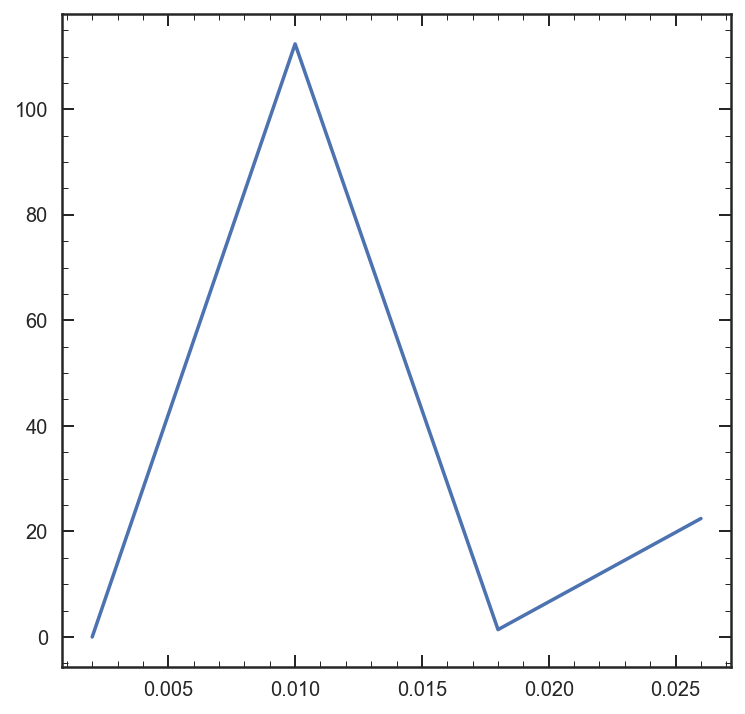

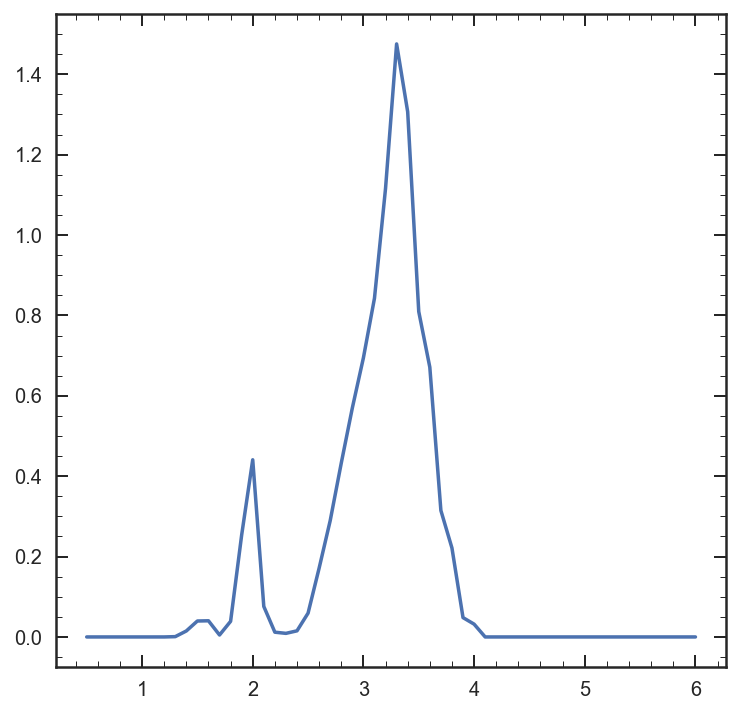

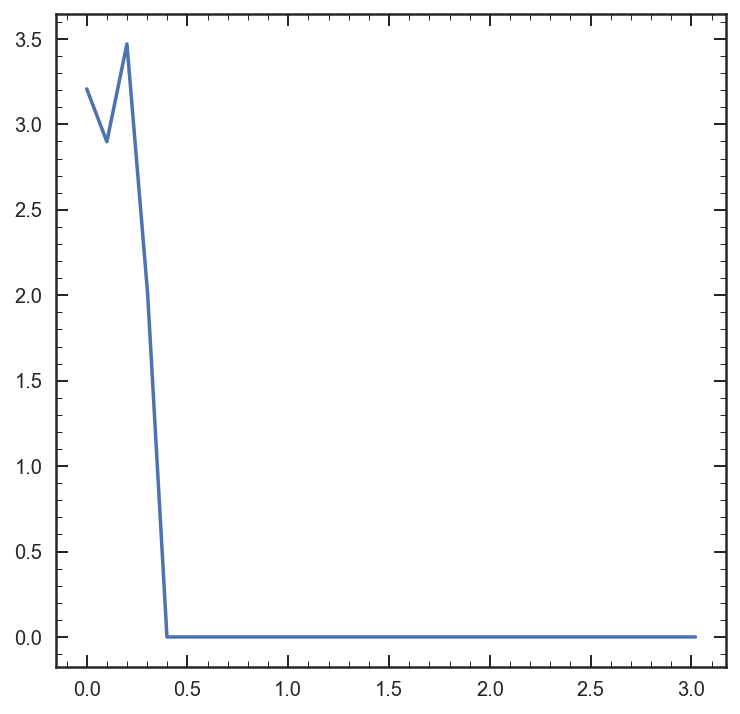

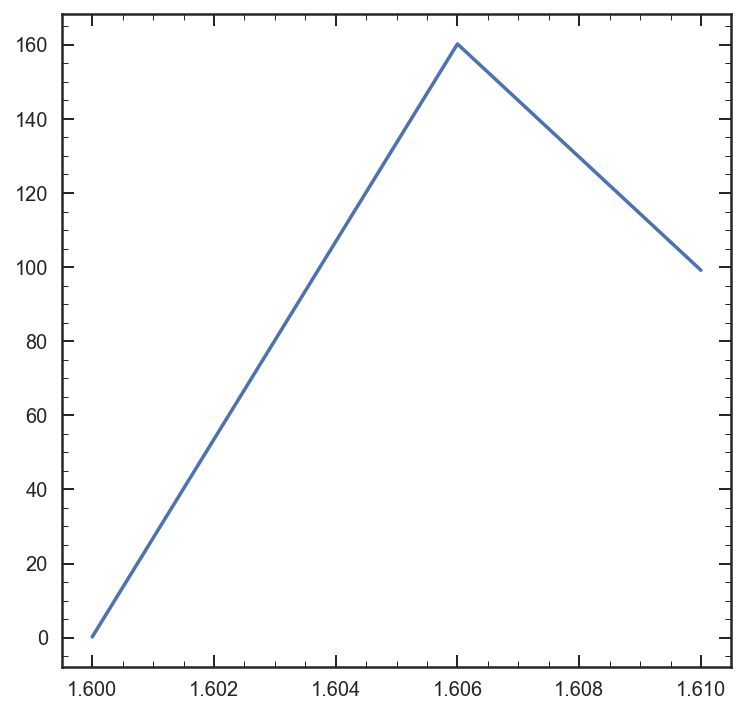

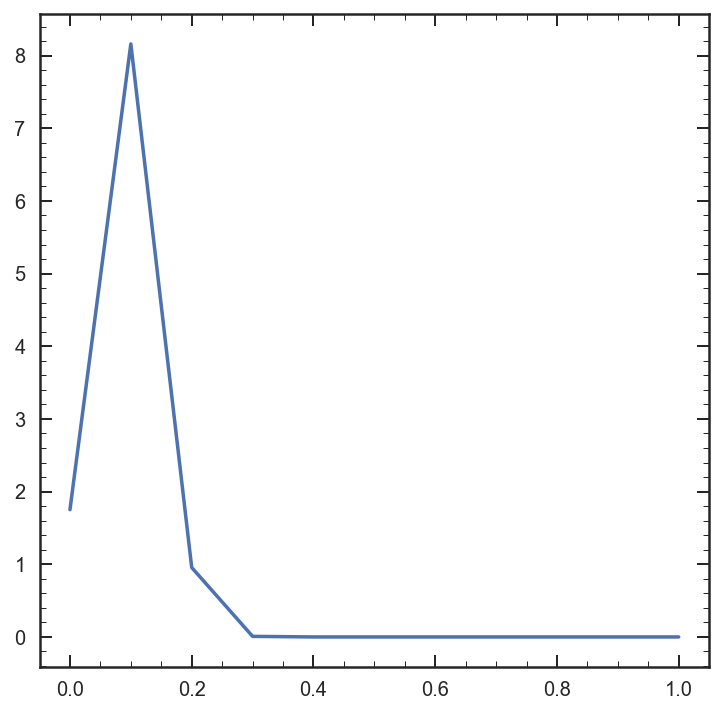

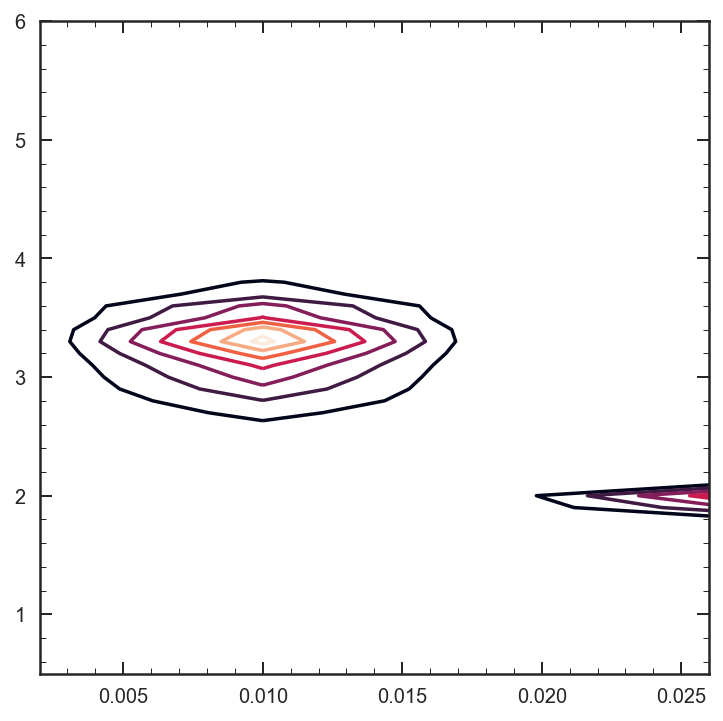

In [56]:
plt.figure(figsize=[6,6])
plt.plot(Z,PZ)

plt.figure(figsize=[6,6])
plt.plot(t,Pt)

plt.figure(figsize=[6,6])
plt.plot(ultau,Ptau)

plt.figure(figsize=[6,6])
plt.plot(z,Pz)

plt.figure(figsize=[6,6])
plt.plot(d,Pd)

Mt,A=np.meshgrid(mtest,age)

plt.figure(figsize=[6,6])
plt.contour(Mt,A,P)